In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import h5py
import sys
import os
import glob
import warnings
from pprint import pprint
import matplotlib.pyplot as plt

from tqdm import tqdm

basedir = '/project/vitelli/jonathan/REDO_fruitfly/'
sys.path.insert(0, os.path.join(basedir, 'release'))

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['font.size'] = 6

warnings.filterwarnings('ignore')

# WT data

100%|██████████| 6/6 [00:00<00:00, 751.89it/s]


[(-1.0, 4.0), (-3.0, 3.0)]

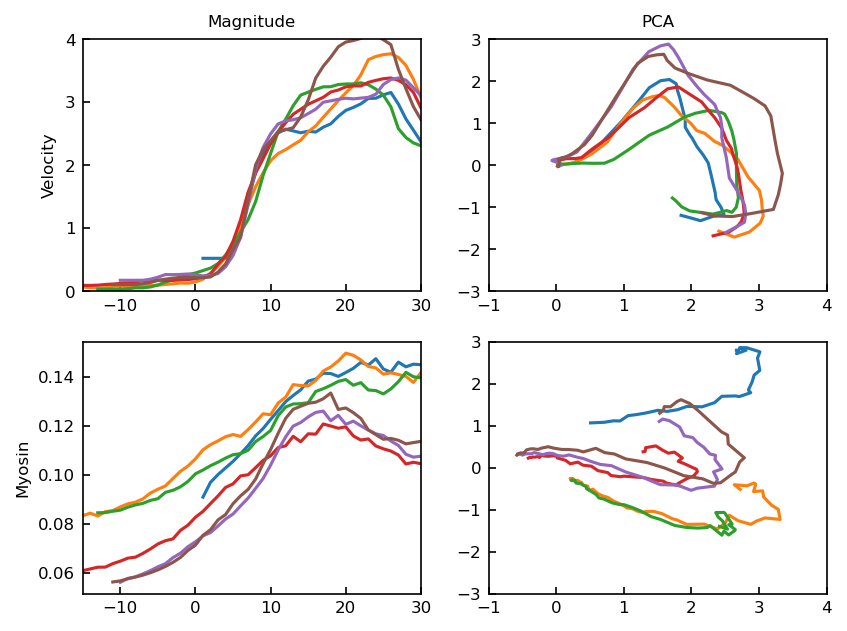

In [2]:
from mutant_datasets import WTDataset
import pickle as pk
from morphogenesis.plot_utils import *
from morphogenesis.decomposition.decomposition_model import SVDPipeline

folder = 'Halo_Hetero_Twist[ey53]_Hetero'
with open(f'../flydrive/{folder}/Sqh-GFP/decomposition_models/tensor_SVDPipeline.pkl', 'rb') as f:
    pca_sqh = pk.load(f)

with open(f'../flydrive/{folder}/Sqh-GFP/decomposition_models/velocity_SVDPipeline.pkl', 'rb') as f:
    pca_vel = pk.load(f)
    
wt = WTDataset()
fig, ax = plt.subplots(2, 2, dpi=150)

for eId in wt.df.embryoID.unique():
    m, v, t = wt.get_trajectory(eId)

    v_pca = pca_vel.transform(v)    
    v_nrm = np.linalg.norm(v, axis=1).mean(axis=(1,2))
    ax[0,0].plot(t, v_nrm)
    ax[0,1].plot(v_pca[:,0], v_pca[:,1])
    
    m_pca = pca_sqh.transform(m)
    m_nrm = np.linalg.norm(m, axis=(1,2)).mean(axis=(1,2))
    ax[1,0].plot(t, m_nrm)
    ax[1,1].plot(m_pca[:,0], m_pca[:,1])
    
ax[0,0].set_ylabel('Velocity')
ax[1,0].set_ylabel('Myosin')
ax[0,0].set_title('Magnitude')
ax[0,1].set_title('PCA')
ax[0,0].set(xlim=[-15, 30], ylim=[0, 4])
ax[1,0].set(xlim=[-15, 30])
ax[0,1].set(xlim=[-1, 4], ylim=[-3, 3])
ax[1,1].set(xlim=[-1, 4], ylim=[-3, 3])

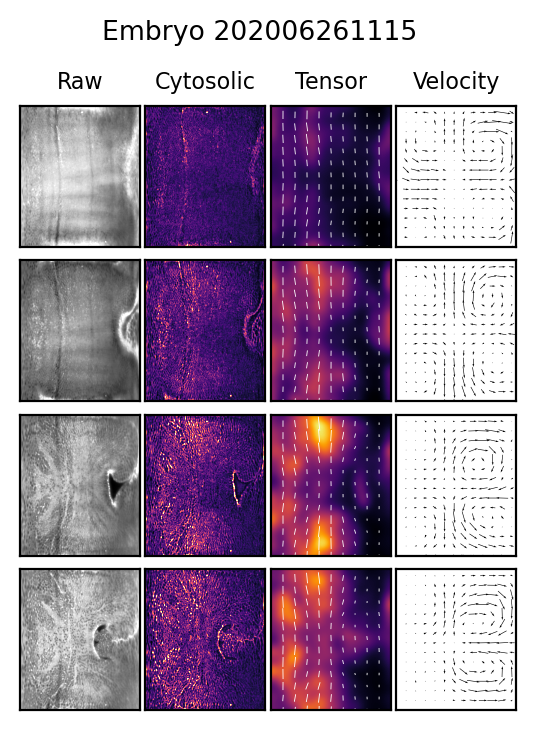

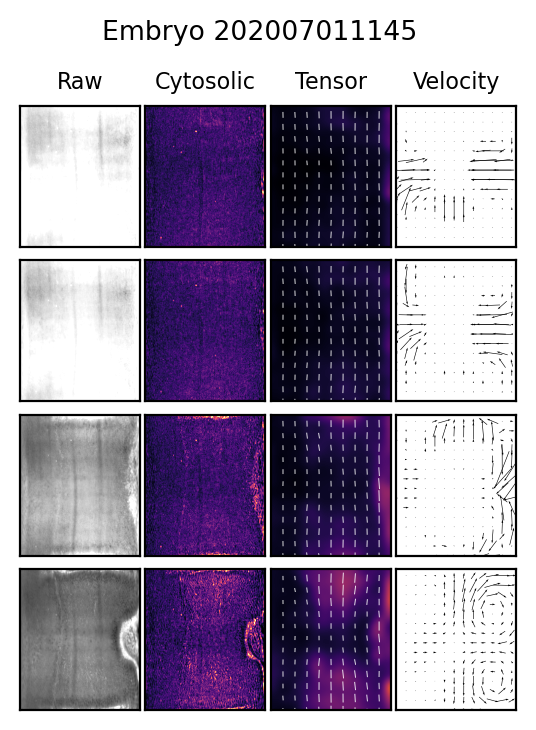

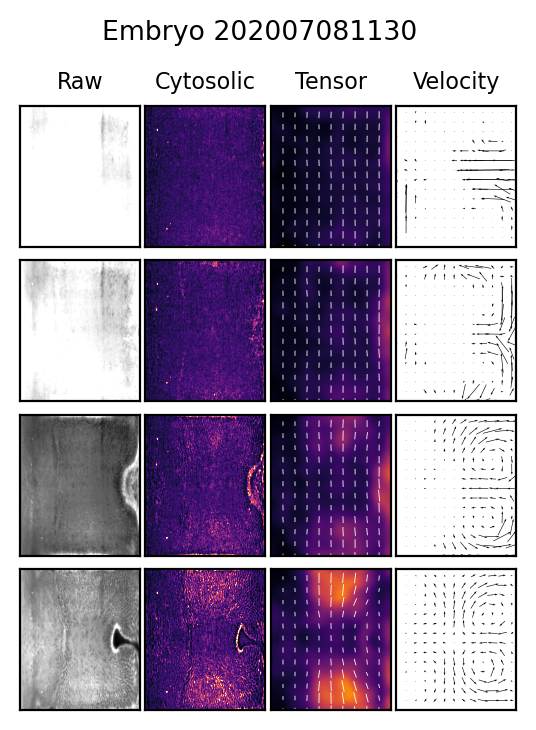

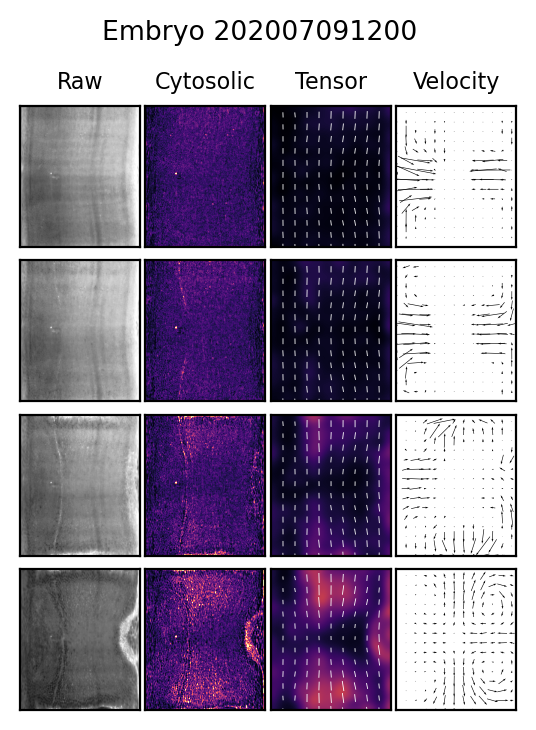

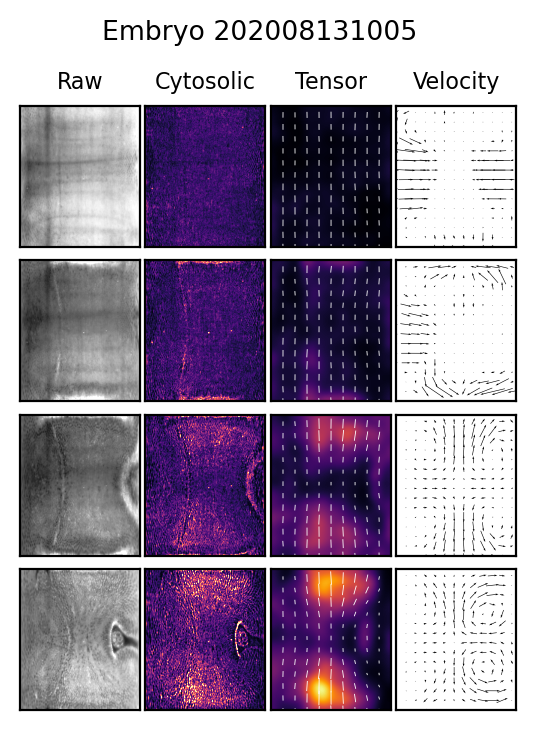

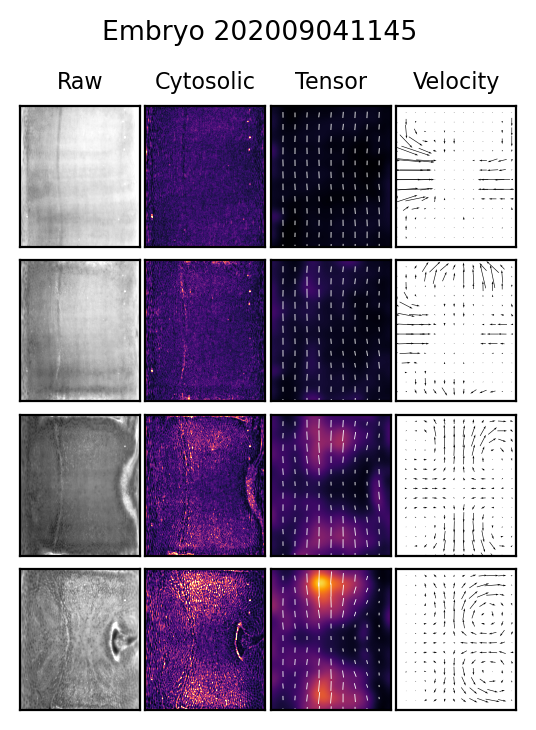

In [3]:
N = 4
dt = 10
folder = wt.genotype
for i, eId in enumerate(wt.df.embryoID.unique()):
    fig, ax = plt.subplots(N, 4, figsize=(4*0.8, N), sharex=True, sharey=True, dpi=200)
    
    raw = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'raw2D.npy'), mmap_mode='r')
    cyt = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'cyt2D.npy'), mmap_mode='r')
    ten = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'tensor2D.npy'), mmap_mode='r')
    vel = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'velocity2D.npy'), mmap_mode='r')
    
    cmin = np.median(cyt) - np.std(cyt)
    cmax = cmin + 5 * np.std(cyt)
    
    mnorm = np.linalg.norm(ten, axis=(1, 2))
    mmin = np.min(mnorm)
    mmax = np.max(mnorm)
    
    for i in range(N):
        plot_scalar(ax[i, 0], raw[i*dt], cmap='Greys_r', vmax_std=10)
        plot_scalar(ax[i, 1], cyt[i*dt], cmap='magma', vmin=cmin, vmax=cmax)
        plot_tensor(ax[i, 2], ten[i*dt], vmin=mmin, vmax=mmax)
        plot_vector(ax[i,3], vel[i*dt], skip=16)
        
    fig.suptitle(f'Embryo {eId}')
    ax[0, 0].set_title('Raw')
    ax[0, 1].set_title('Cytosolic')
    ax[0, 2].set_title('Tensor')
    ax[0, 3].set_title('Velocity')
    ax[0, 0].set_xlim([ap_min, ap_max])
    ax[0, 0].set_ylim([dv_min, dv_max])

    fig.subplots_adjust(hspace=0.01, wspace=0.05)


# Twist mutants

100%|██████████| 6/6 [00:00<00:00, 88.19it/s]


[(-1.0, 4.0), (-3.0, 3.0)]

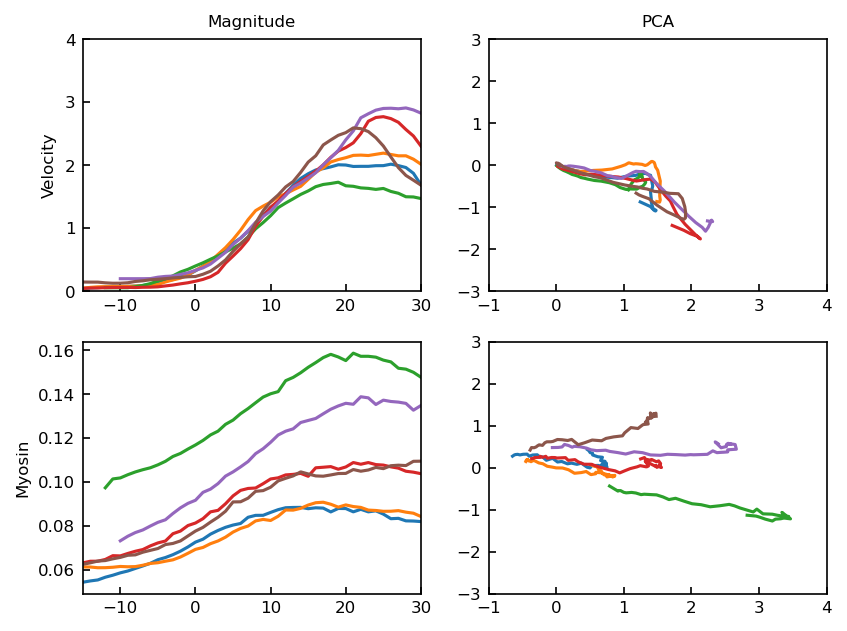

In [4]:
from mutant_datasets import TwistDataset
from utils.plot_utils import *
    
twist = TwistDataset()
fig, ax = plt.subplots(2, 2, dpi=150)

for eId in twist.df.embryoID.unique():
    m, v, t = twist.get_trajectory(eId)

    v_pca = pca_vel.transform(v)    
    v_nrm = np.linalg.norm(v, axis=1).mean(axis=(1,2))
    ax[0,0].plot(t, v_nrm)
    ax[0,1].plot(v_pca[:,0], v_pca[:,1])
    
    m_pca = pca_sqh.transform(m)
    m_nrm = np.linalg.norm(m, axis=(1,2)).mean(axis=(1,2))
    ax[1,0].plot(t, m_nrm)
    ax[1,1].plot(m_pca[:,0], m_pca[:,1])
    
ax[0,0].set_ylabel('Velocity')
ax[1,0].set_ylabel('Myosin')
ax[0,0].set_title('Magnitude')
ax[0,1].set_title('PCA')
ax[0,0].set(xlim=[-15, 30], ylim=[0, 4])
ax[1,0].set(xlim=[-15, 30])
ax[0,1].set(xlim=[-1, 4], ylim=[-3, 3])
ax[1,1].set(xlim=[-1, 4], ylim=[-3, 3])

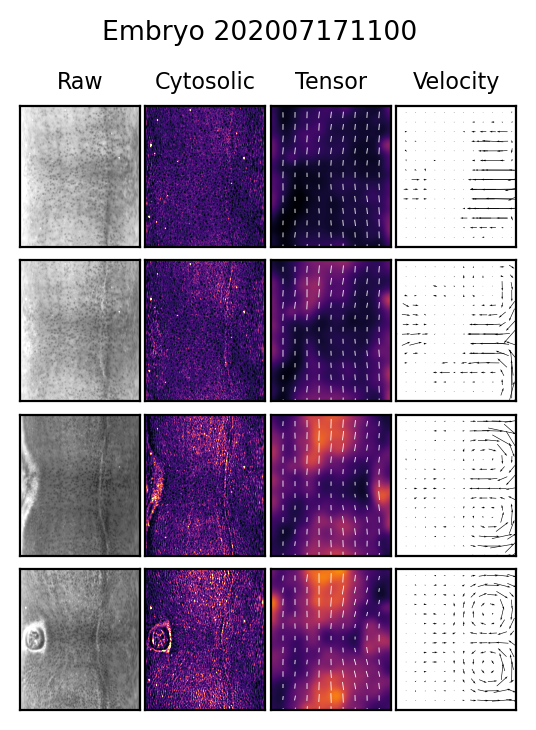

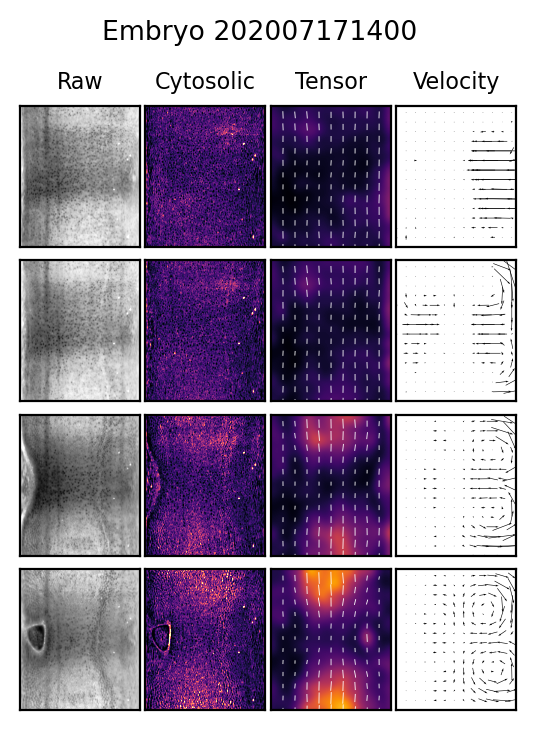

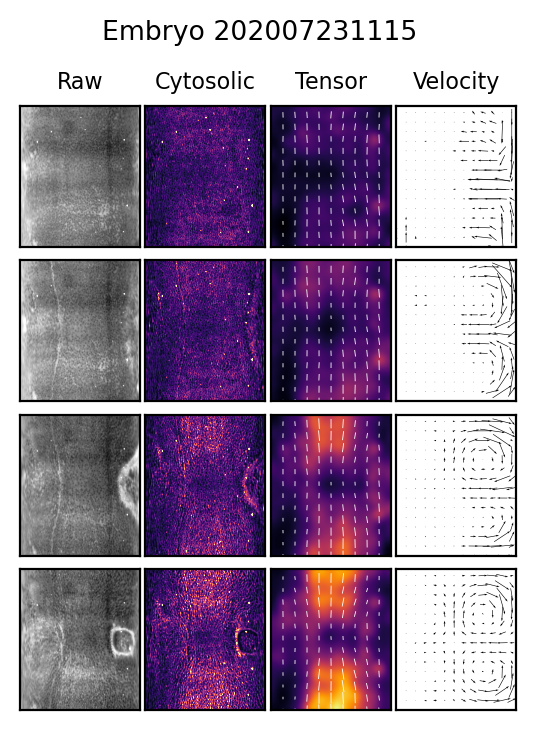

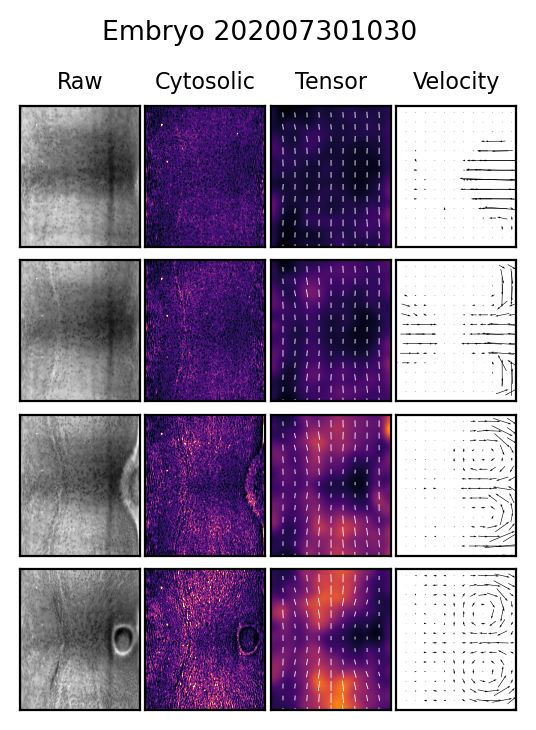

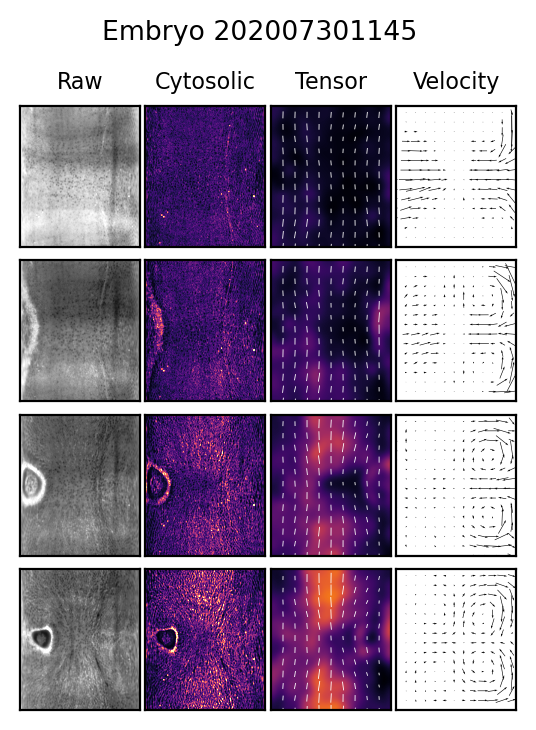

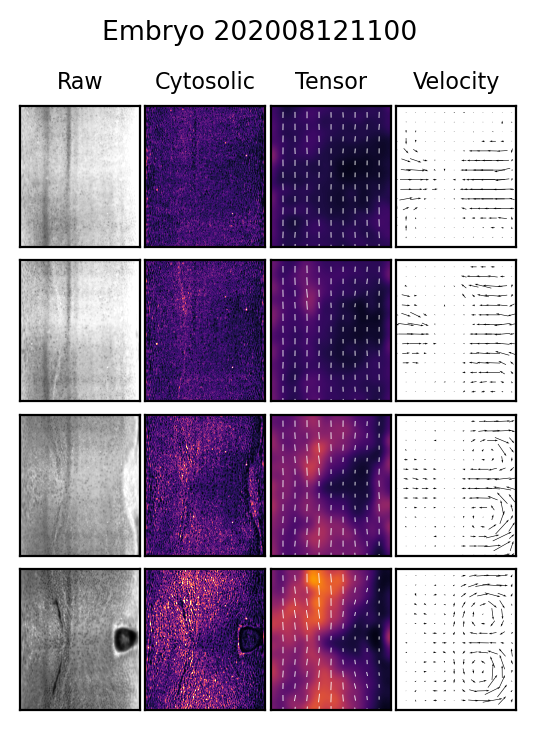

In [5]:
N = 4
dt = 10
folder = twist.genotype
for i, eId in enumerate(twist.df.embryoID.unique()):
    fig, ax = plt.subplots(N, 4, figsize=(4*0.8, N), sharex=True, sharey=True, dpi=200)
    
    eIdx = twist.df.eIdx[twist.df.embryoID == eId]
    
    raw = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'raw2D.npy'), mmap_mode='r')[eIdx]
    cyt = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'cyt2D.npy'), mmap_mode='r')[eIdx]
    ten, vel, _ = twist.get_trajectory(eId)
    #ten = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'tensor2D.npy'), mmap_mode='r')
    #vel = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'velocity2D.npy'), mmap_mode='r')
    
    cmin = np.median(cyt) - np.std(cyt)
    cmax = cmin + 5 * np.std(cyt)
    
    dev = ten - np.einsum('tkkyx,ij->tijyx', ten, np.eye(2))
    mnorm = np.linalg.norm(dev, axis=(1, 2))
    mmin = np.min(mnorm)
    mmax = np.max(mnorm)
    
    for i in range(N):
        color_2D(ax[i, 0], raw[i*dt], cmap='Greys_r', vmax_std=10)
        color_2D(ax[i, 1], cyt[i*dt], cmap='magma', vmin=cmin, vmax=cmax)
        plot_tensor2D(ax[i, 2], ten[i*dt], vmin=mmin, vmax=mmax)
        plot_vector2D(ax[i,3], vel[i*dt], skip=16)
        
    fig.suptitle(f'Embryo {eId}')
    ax[0, 0].set_title('Raw')
    ax[0, 1].set_title('Cytosolic')
    ax[0, 2].set_title('Tensor')
    ax[0, 3].set_title('Velocity')
    ax[0, 0].set_xlim([ap_min, ap_max])
    ax[0, 0].set_ylim([dv_min, dv_max])

    fig.subplots_adjust(hspace=0.01, wspace=0.05)


# Toll[RM9] Mutants

100%|██████████| 3/3 [00:00<00:00, 447.62it/s]


[(-1.0, 4.0), (-3.0, 3.0)]

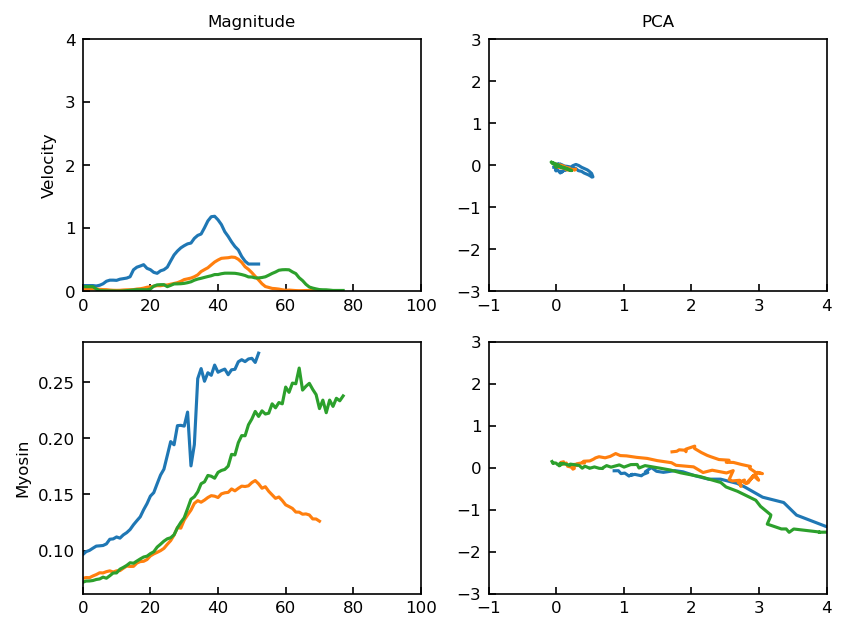

In [6]:
from mutant_datasets import TollDataset
from morphogenesis.plot_utils import *    
toll = TollDataset(tmax=100)
fig, ax = plt.subplots(2, 2, dpi=150)

for eId in toll.df.embryoID.unique():
    m, v, t = toll.get_trajectory(eId)

    v_pca = pca_vel.transform(v)    
    v_nrm = np.linalg.norm(v, axis=1).mean(axis=(1,2))
    ax[0,0].plot(t, v_nrm)
    ax[0,1].plot(v_pca[:,0], v_pca[:,1])
    
    m_pca = pca_sqh.transform(m)
    m_nrm = np.linalg.norm(m, axis=(1,2)).mean(axis=(1,2))
    ax[1,0].plot(t, m_nrm)
    ax[1,1].plot(m_pca[:,0], m_pca[:,1])
    
ax[0,0].set_ylabel('Velocity')
ax[1,0].set_ylabel('Myosin')
ax[0,0].set_title('Magnitude')
ax[0,1].set_title('PCA')
ax[0,0].set(xlim=[0, 100], ylim=[0, 4])
ax[1,0].set(xlim=[0, 100])
ax[0,1].set(xlim=[-1, 4], ylim=[-3, 3])
ax[1,1].set(xlim=[-1, 4], ylim=[-3, 3])

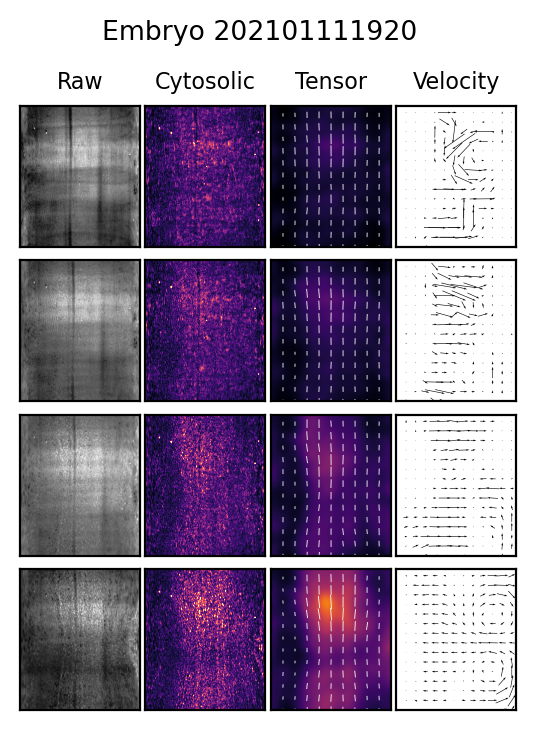

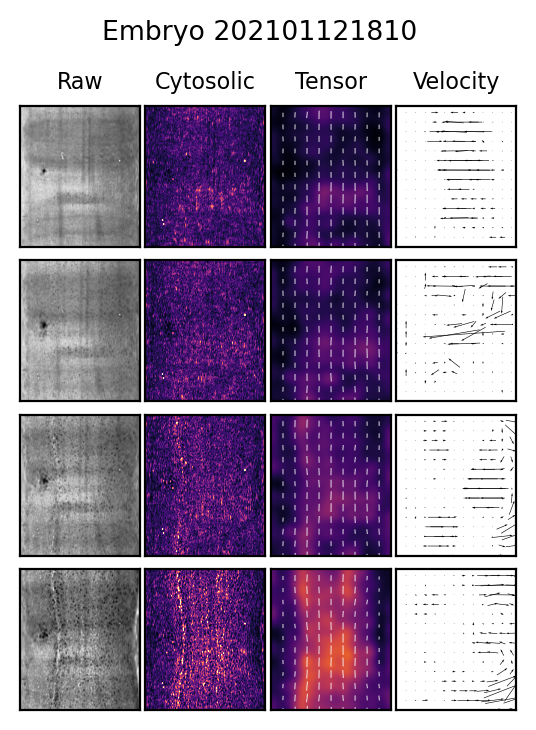

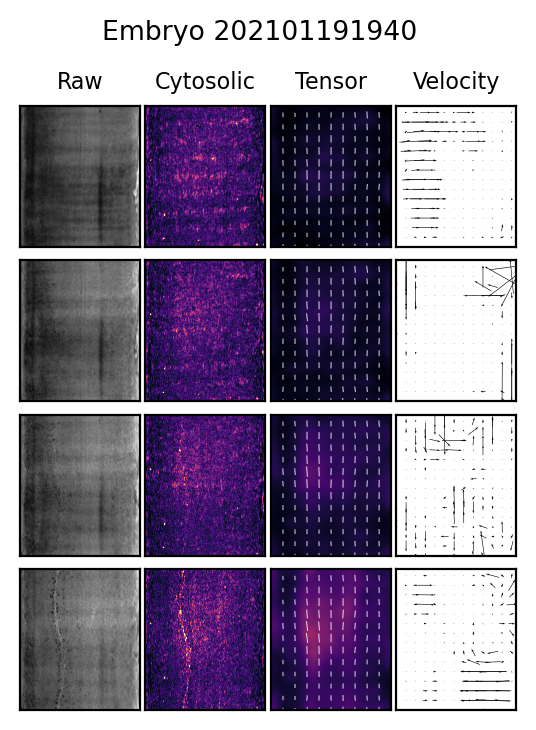

In [7]:
N = 4
dt = 10
folder = toll.genotype
for i, eId in enumerate(toll.df.embryoID.unique()):
    fig, ax = plt.subplots(N, 4, figsize=(4*0.8, N), sharex=True, sharey=True, dpi=200)
    
    eIdx = toll.df.eIdx[toll.df.embryoID == eId]
    
    raw = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'raw2D.npy'), mmap_mode='r')[eIdx]
    cyt = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'cyt2D.npy'), mmap_mode='r')[eIdx]
    ten, vel, _ = toll.get_trajectory(eId)
    #ten = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'tensor2D.npy'), mmap_mode='r')
    #vel = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'velocity2D.npy'), mmap_mode='r')
    
    cmin = np.median(cyt) - np.std(cyt)
    cmax = cmin + 5 * np.std(cyt)
    
    dev = ten - np.einsum('tkkyx,ij->tijyx', ten, np.eye(2))
    mnorm = np.linalg.norm(dev, axis=(1, 2))
    mmin = np.min(mnorm)
    mmax = np.max(mnorm)
    
    for i in range(N):
        try:
            plot_scalar(ax[i, 0], raw[i*dt], cmap='Greys_r')
            plot_scalar(ax[i, 1], cyt[i*dt], cmap='magma', vmin=cmin, vmax=cmax)
            plot_tensor(ax[i, 2], ten[i*dt], vmin=mmin, vmax=mmax)
            plot_vector(ax[i,3], vel[i*dt], skip=16)
        except:
            for j in range(4):
                ax[i,j].axis('off')
        
    fig.suptitle(f'Embryo {eId}')
    ax[0, 0].set_title('Raw')
    ax[0, 1].set_title('Cytosolic')
    ax[0, 2].set_title('Tensor')
    ax[0, 3].set_title('Velocity')
    ax[0, 0].set_xlim([ap_min, ap_max])
    ax[0, 0].set_ylim([dv_min, dv_max])

    fig.subplots_adjust(hspace=0.01, wspace=0.05)


# Spaetzle[A] mutants

100%|██████████| 4/4 [00:00<00:00, 276.61it/s]


[(-1.0, 4.0), (-3.0, 3.0)]

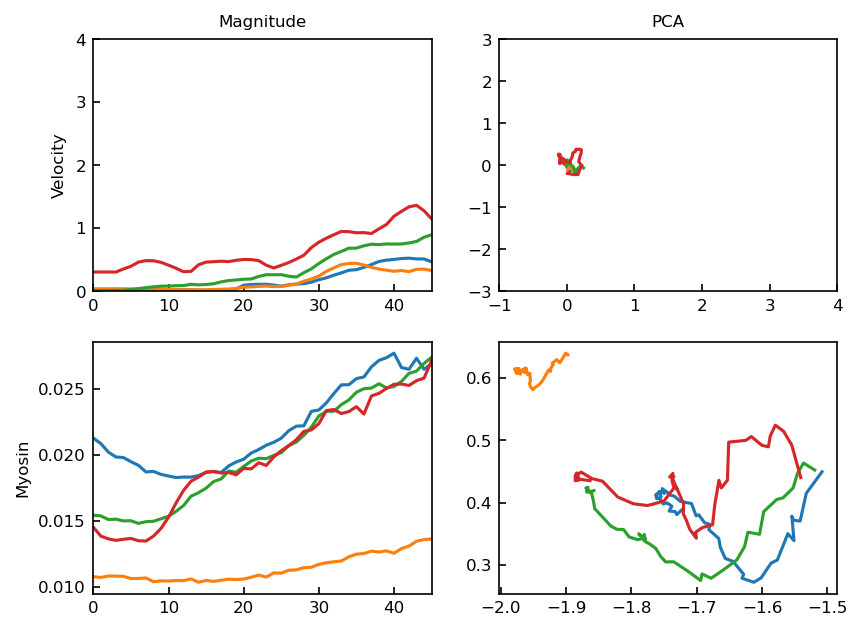

In [8]:
from mutant_datasets import SpaetzleDataset
from utils.plot_utils import *
    
spz = SpaetzleDataset()
fig, ax = plt.subplots(2, 2, dpi=150)

for eId in spz.df.embryoID.unique():
    m, v, t = spz.get_trajectory(eId)

    v_pca = pca_vel.transform(v)    
    v_nrm = np.linalg.norm(v, axis=1).mean(axis=(1,2))
    ax[0,0].plot(t, v_nrm)
    ax[0,1].plot(v_pca[:,0], v_pca[:,1])
    
    m_pca = pca_sqh.transform(m)
    m_nrm = np.linalg.norm(m, axis=(1,2)).mean(axis=(1,2))
    ax[1,0].plot(t, m_nrm)
    ax[1,1].plot(m_pca[:,0], m_pca[:,1])
    
ax[0,0].set_ylabel('Velocity')
ax[1,0].set_ylabel('Myosin')
ax[0,0].set_title('Magnitude')
ax[0,1].set_title('PCA')
ax[0,0].set(xlim=[0, 45], ylim=[0, 4])
ax[1,0].set(xlim=[0, 45])
ax[0,1].set(xlim=[-1, 4], ylim=[-3, 3])
#ax[1,1].set(xlim=[-1, 4], ylim=[-3, 3])

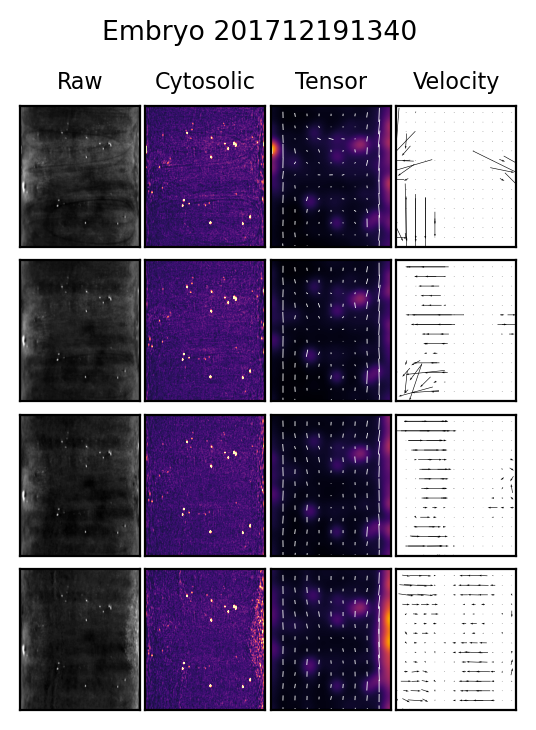

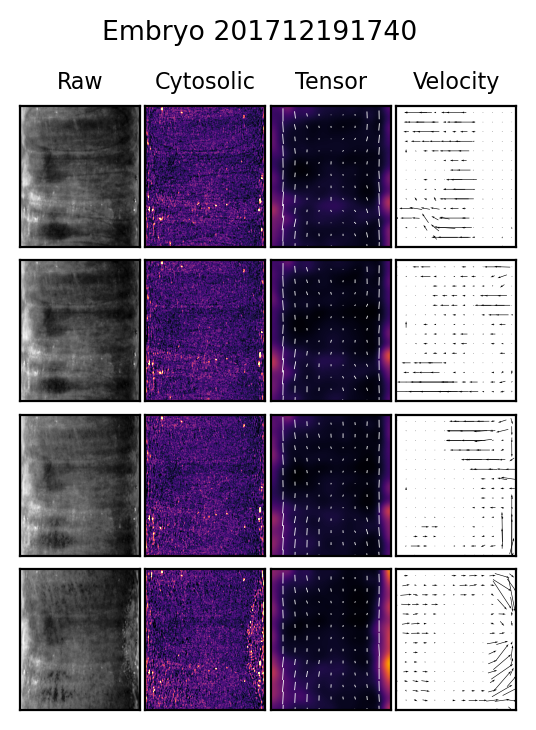

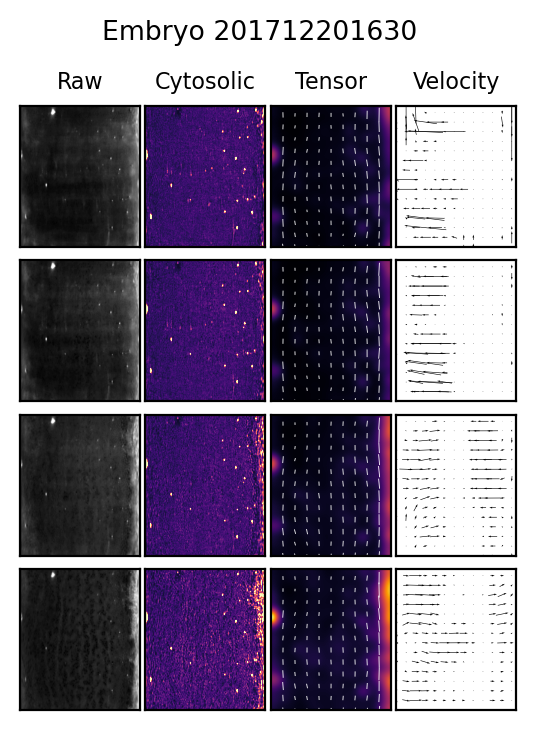

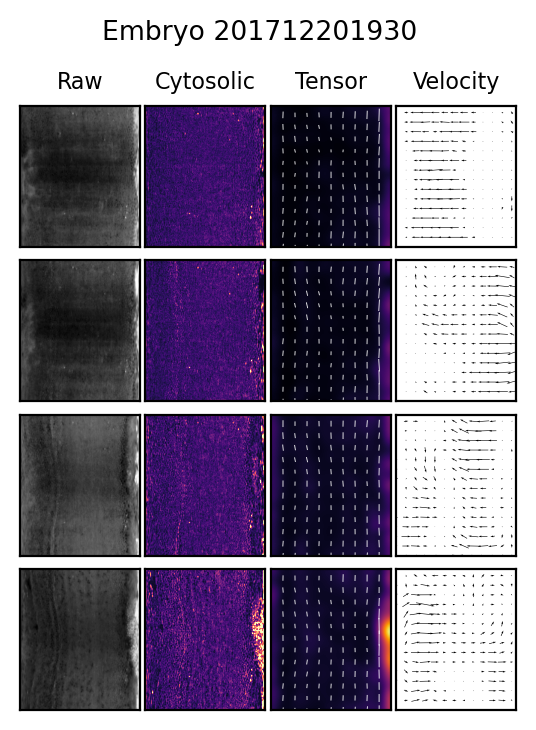

In [9]:
N = 4
dt = 10
folder = spz.genotype
for i, eId in enumerate(spz.df.embryoID.unique()):
    fig, ax = plt.subplots(N, 4, figsize=(4*0.8, N), sharex=True, sharey=True, dpi=200)
    
    eIdx = spz.df.eIdx[spz.df.embryoID == eId]
    
    raw = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'raw2D.npy'), mmap_mode='r')[eIdx]
    cyt = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'cyt2D.npy'), mmap_mode='r')[eIdx]
    ten, vel, _ = spz.get_trajectory(eId)
    #ten = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'tensor2D.npy'), mmap_mode='r')
    #vel = np.load(os.path.join('../flydrive', folder, 'Sqh-GFP', str(eId), 'velocity2D.npy'), mmap_mode='r')
    
    cmin = np.median(cyt) - np.std(cyt)
    cmax = cmin + 5 * np.std(cyt)
    
    dev = ten - np.einsum('tkkyx,ij->tijyx', ten, np.eye(2))
    mnorm = np.linalg.norm(dev, axis=(1, 2))
    mmin = np.min(mnorm)
    mmax = np.max(mnorm)
    
    for i in range(N):
        try:
            plot_scalar(ax[i, 0], raw[i*dt], cmap='Greys_r')
            plot_scalar(ax[i, 1], cyt[i*dt], cmap='magma', vmin=cmin, vmax=cmax)
            plot_tensor(ax[i, 2], ten[i*dt], vmin=mmin, vmax=mmax)
            plot_vector(ax[i,3], vel[i*dt], skip=16)
        except:
            for j in range(4):
                ax[i,j].axis('off')
        
    fig.suptitle(f'Embryo {eId}')
    ax[0, 0].set_title('Raw')
    ax[0, 1].set_title('Cytosolic')
    ax[0, 2].set_title('Tensor')
    ax[0, 3].set_title('Velocity')
    ax[0, 0].set_xlim([ap_min, ap_max])
    ax[0, 0].set_ylim([dv_min, dv_max])

    fig.subplots_adjust(hspace=0.01, wspace=0.05)
